In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

torch.manual_seed(0) 

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [3]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [5]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
         )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

## Noise

To be able to use the generator, we will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same. We will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, we will generate all the noise vectors at once.

Note that whenever we create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. torch.ones(3, 3, device=device), or move it onto the target device using torch.ones(3, 3).to(device). You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as torch.ones_like. In general, use torch.ones_like and torch.zeros_like instead of torch.ones or torch.zeros where possible.

In [6]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    return torch.randn(n_samples, z_dim, device=device)
    #Alternative: return torch.randn(n_samples, z_dim).to(device)


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

In [8]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

The image dimension
The hidden dimension
The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.

In [9]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

## Training
Now you can put it all together! First, you will set your parameters:

criterion: the loss function 

n_epochs: the number of times you iterate through the entire dataset when training 

z_dim: the dimension of the noise vector

display_step: how often to display/visualize the images

batch_size: the number of images per forward/backward pass

lr: the learning rate

device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.

In [11]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

100.1%

Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw


113.5%

Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw


100.4%

Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw


180.4%

Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw
Processing...
Done!


C:\ProgramData\Anaconda3\envs\pytorchproject\lib\site-packages\torchvision\datasets\mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.



In [12]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (criterion) and you are encouraged to use torch.ones_like and torch.zeros_like instead of torch.ones or torch.zeros. If you use torch.ones or torch.zeros, you'll need to pass device=device to them.

In [13]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    # Create noise vectors and generate a batch (num_images) of fake images
    fake_noise = get_noise(num_images, z_dim, device=device)
    
    # Get the discriminator's prediction of the fake image 
    # and calculate the loss. Don't forget to detach the generator!
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    # Get the discriminator's prediction of the real image and calculate the loss.
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    
    # Calculate the discriminator's loss by averaging the real and fake loss
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    
    return disc_loss

In [14]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    # Create noise vectors and generate a batch of fake images. 
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    
    # Get the discriminator's prediction of the fake image.
    disc_fake_pred = disc(fake)
    
    # Calculate the generator's loss. Remember the generator wants
    # the discriminator to think that its fake images are real
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
   
    return gen_loss

Step 500: Generator loss: 1.4522949966192233, discriminator loss: 0.4217786370515826


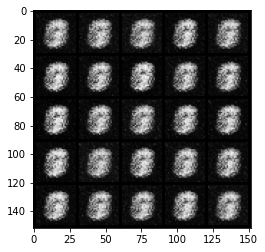

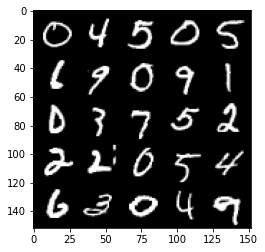

Step 1000: Generator loss: 1.7750270390510576, discriminator loss: 0.2789987175464629


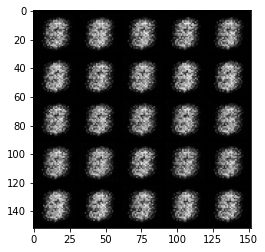

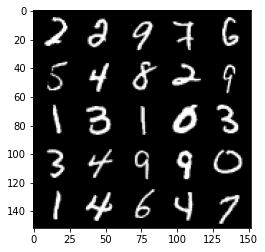

Step 1500: Generator loss: 2.069333546638489, discriminator loss: 0.15986011868715286


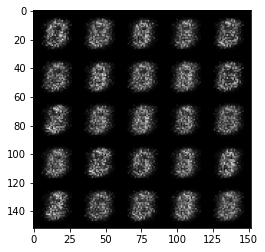

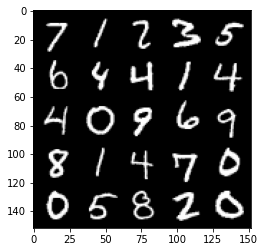

Step 2000: Generator loss: 1.708204234838486, discriminator loss: 0.22214911791682265


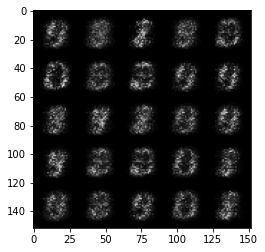

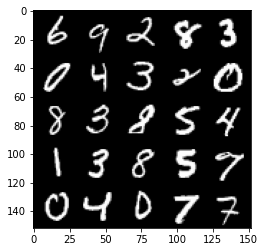

Step 2500: Generator loss: 1.6616325852870912, discriminator loss: 0.2081962929069997


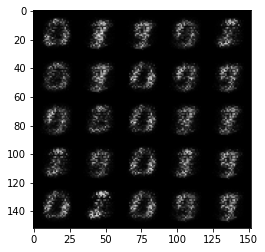

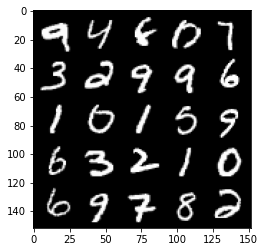

Step 3000: Generator loss: 2.020635592699052, discriminator loss: 0.1415534608364104


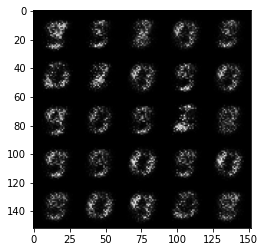

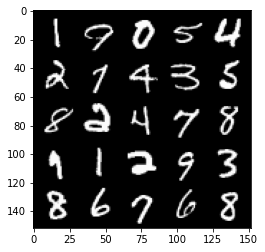

Step 3500: Generator loss: 2.304911481380461, discriminator loss: 0.13782811836898312


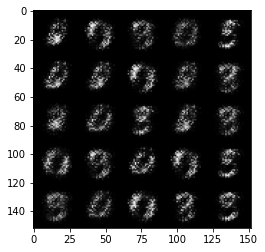

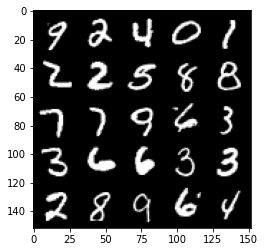

Step 4000: Generator loss: 2.56098373222351, discriminator loss: 0.1338753135800362


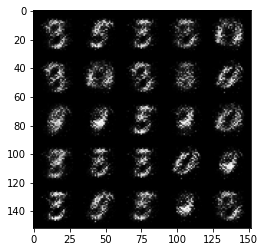

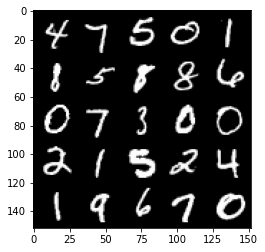

Step 4500: Generator loss: 3.065453282356263, discriminator loss: 0.10450562460720532


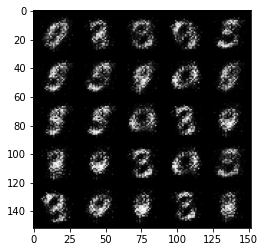

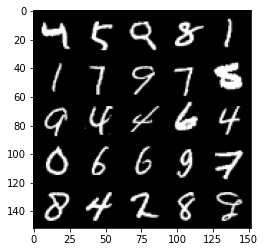

Step 5000: Generator loss: 3.2508964672088636, discriminator loss: 0.09362269557267433


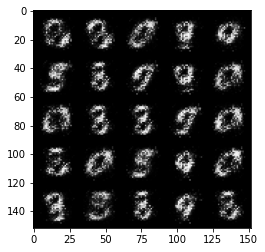

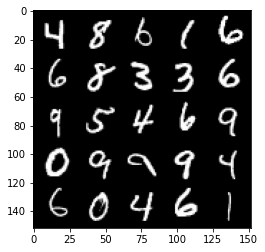

Step 5500: Generator loss: 3.464047861576081, discriminator loss: 0.0795101041048765


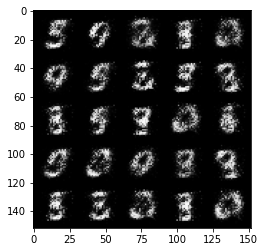

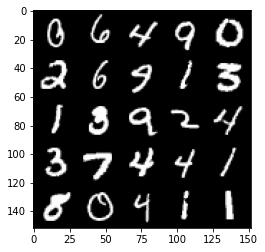

Step 6000: Generator loss: 3.7620371913909914, discriminator loss: 0.06177901624143124


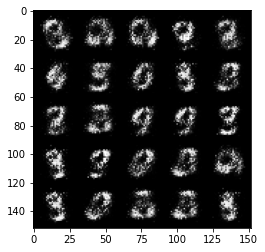

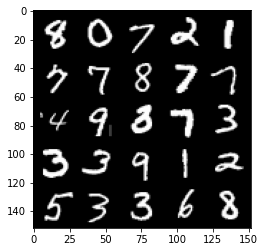

Step 6500: Generator loss: 3.850254536628725, discriminator loss: 0.061170011542737456


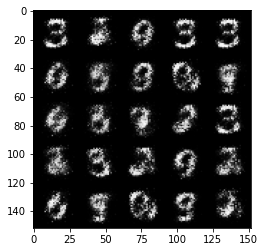

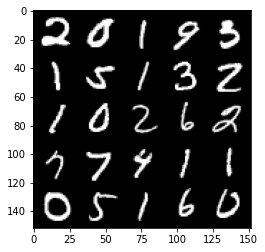

Step 7000: Generator loss: 3.679243010997771, discriminator loss: 0.06986545837670567


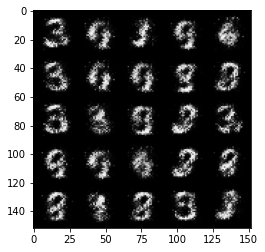

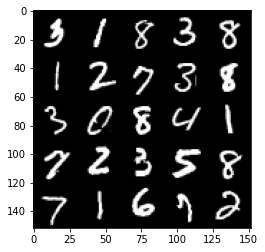

Step 7500: Generator loss: 3.9069695105552675, discriminator loss: 0.059161646362394134


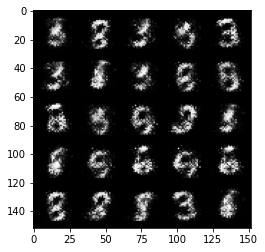

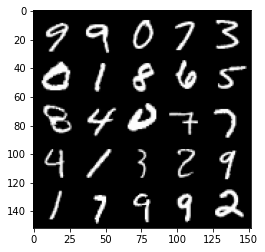

Step 8000: Generator loss: 4.106761023998259, discriminator loss: 0.05815796400606632


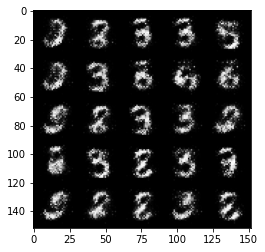

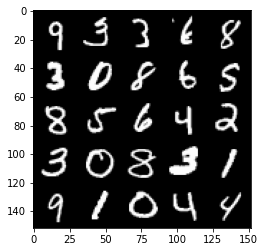

Step 8500: Generator loss: 4.055274777412413, discriminator loss: 0.060760685507208076


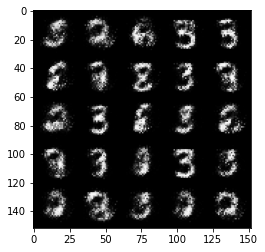

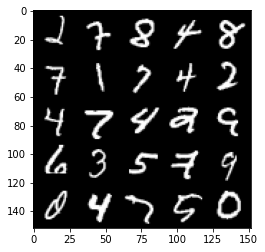

Step 9000: Generator loss: 4.021789585590361, discriminator loss: 0.06429060164093965


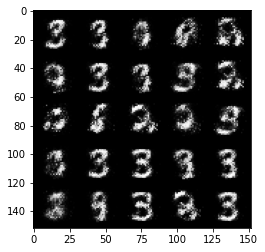

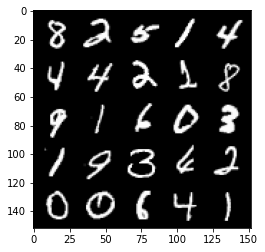

Step 9500: Generator loss: 4.16491564130783, discriminator loss: 0.05971106595173477


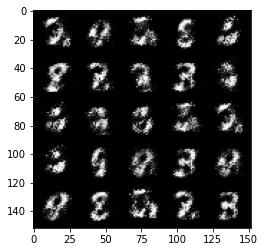

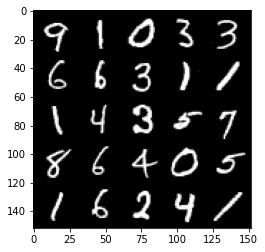

Step 10000: Generator loss: 4.090038180828095, discriminator loss: 0.07209864127635955


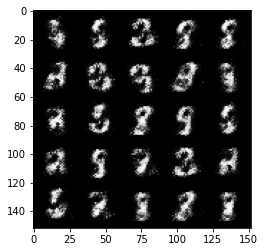

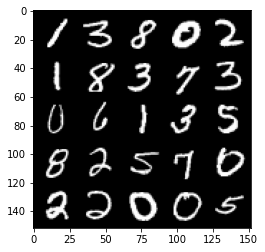

Step 10500: Generator loss: 4.043902151584623, discriminator loss: 0.0754518036916852


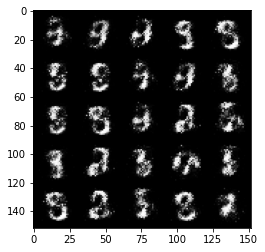

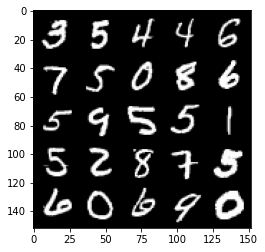

Step 11000: Generator loss: 4.119986305713654, discriminator loss: 0.07059931670129292


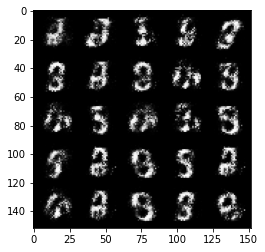

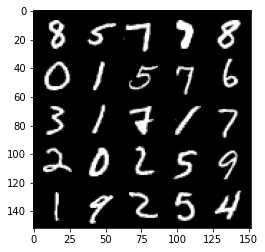

Step 11500: Generator loss: 4.053549334526064, discriminator loss: 0.08078181375563141


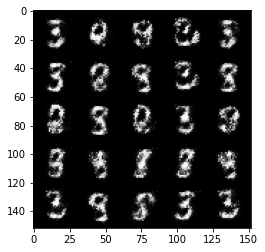

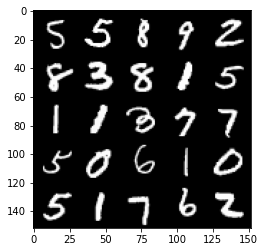

Step 12000: Generator loss: 4.027002871513368, discriminator loss: 0.08053547070920461


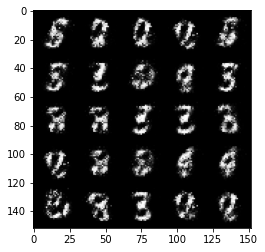

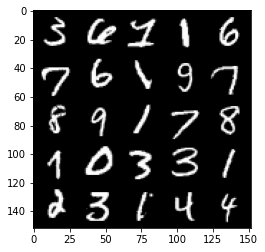

Step 12500: Generator loss: 4.027800284385686, discriminator loss: 0.07637343814969061


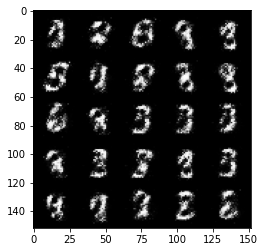

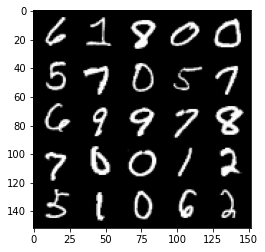

Step 13000: Generator loss: 4.042331405639652, discriminator loss: 0.08406531813740725


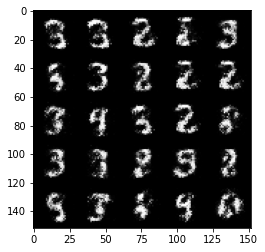

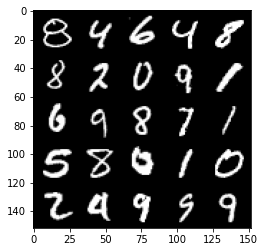

Step 13500: Generator loss: 3.8964715385437, discriminator loss: 0.08544142254441972


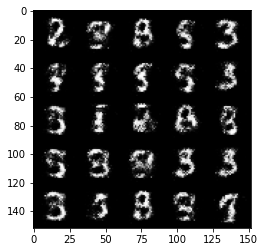

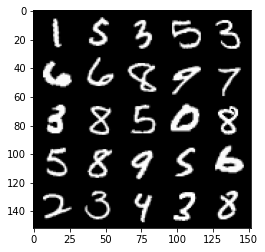

Step 14000: Generator loss: 3.7476141557693485, discriminator loss: 0.09277076824009418


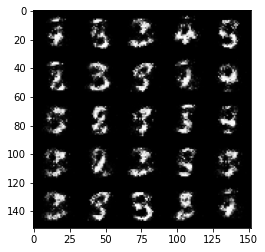

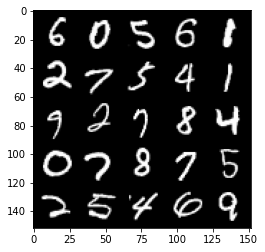

Step 14500: Generator loss: 3.684640074729917, discriminator loss: 0.09295677378028629


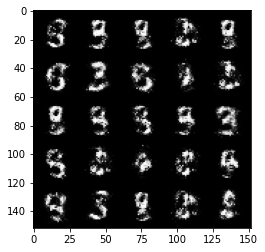

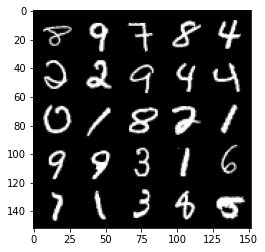

Step 15000: Generator loss: 3.903565934181215, discriminator loss: 0.09087270284816623


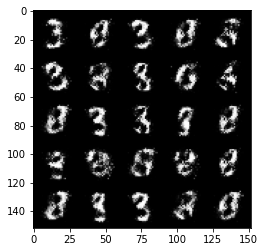

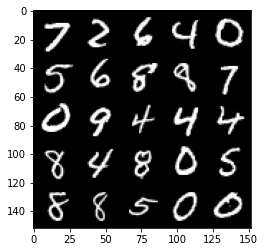

Step 15500: Generator loss: 4.001493029117579, discriminator loss: 0.08770844234526158


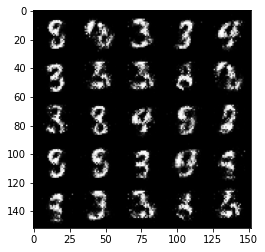

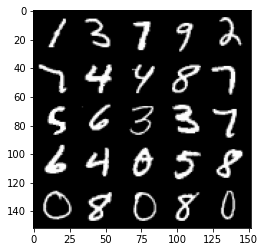

Step 16000: Generator loss: 3.7751522660255428, discriminator loss: 0.09377728229761123


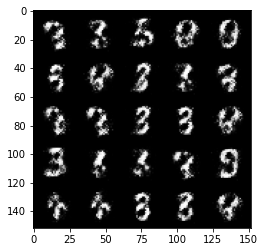

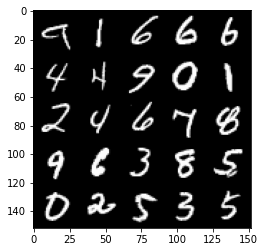

Step 16500: Generator loss: 3.658835784435272, discriminator loss: 0.10663451702892769


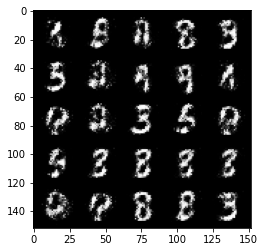

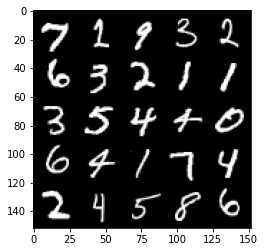

Step 17000: Generator loss: 3.7268609743118284, discriminator loss: 0.13292027433216566


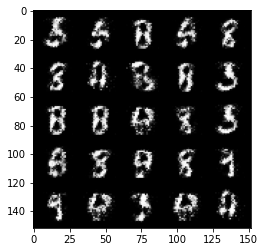

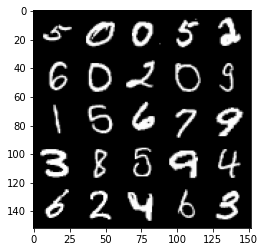

Step 17500: Generator loss: 3.743198780536653, discriminator loss: 0.11477446088939906


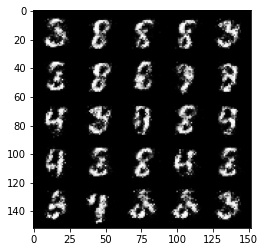

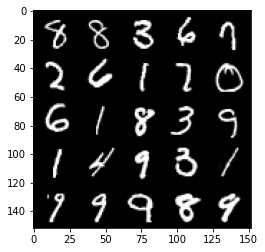

Step 18000: Generator loss: 3.7236719088554335, discriminator loss: 0.12096425356715927


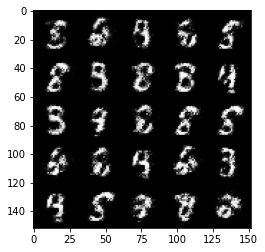

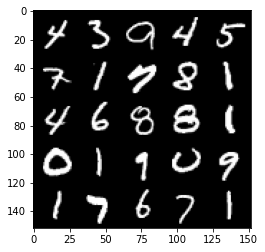

Step 18500: Generator loss: 3.757841669559479, discriminator loss: 0.11260762836784122


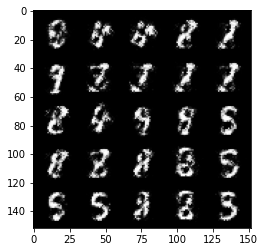

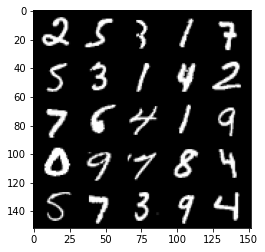

Step 19000: Generator loss: 3.5568873052597074, discriminator loss: 0.1312170559465886


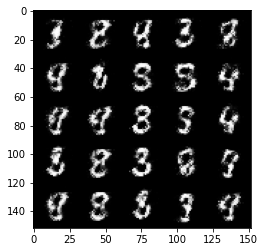

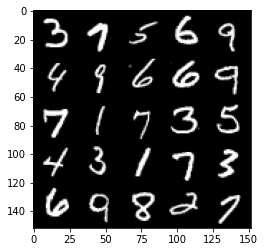

Step 19500: Generator loss: 3.415070029735565, discriminator loss: 0.13841299045085914


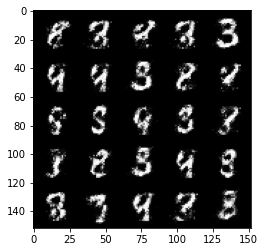

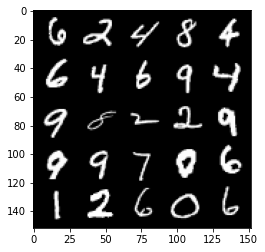

Step 20000: Generator loss: 3.4511251173019435, discriminator loss: 0.1299120512008667


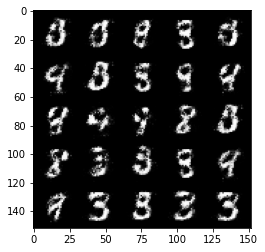

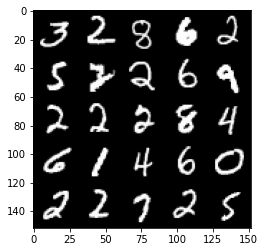

Step 20500: Generator loss: 3.377033951282503, discriminator loss: 0.13686270359158512


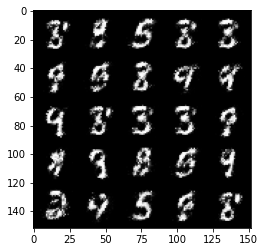

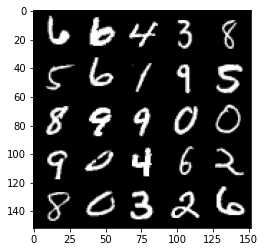

Step 21000: Generator loss: 3.4081624927520777, discriminator loss: 0.14739682833850382


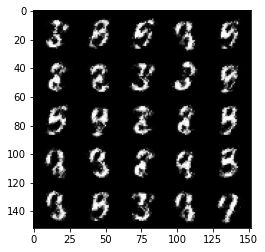

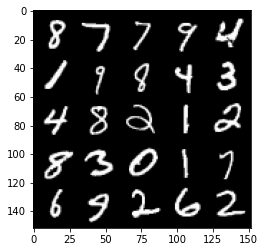

Step 21500: Generator loss: 3.308379069328306, discriminator loss: 0.16252503502368926


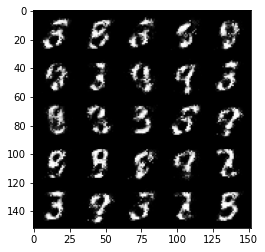

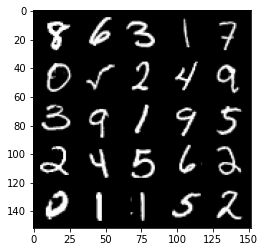

Step 22000: Generator loss: 3.4443860206604056, discriminator loss: 0.13326150890439747


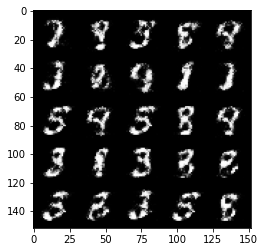

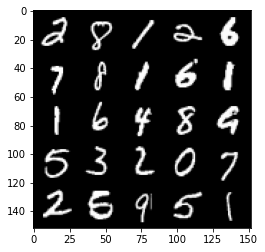

Step 22500: Generator loss: 3.2341600151062013, discriminator loss: 0.17063459622859958


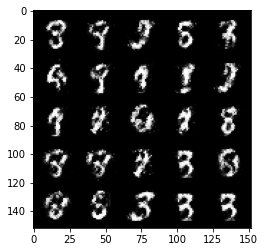

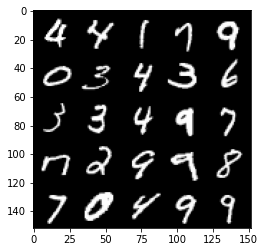

Step 23000: Generator loss: 3.037889293193816, discriminator loss: 0.1886221504807472


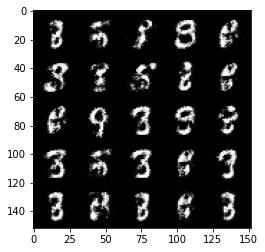

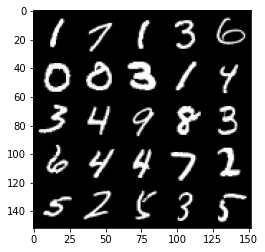

Step 23500: Generator loss: 3.209163118362425, discriminator loss: 0.1572647031247618


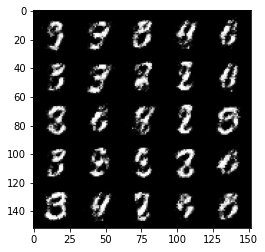

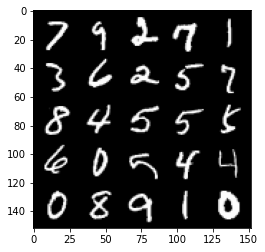

Step 24000: Generator loss: 2.977768068790434, discriminator loss: 0.19616597335040575


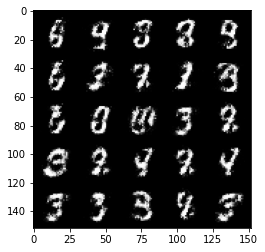

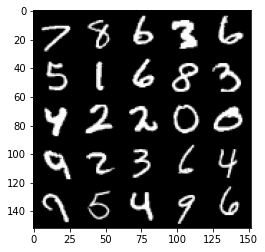

Step 24500: Generator loss: 2.9652194743156444, discriminator loss: 0.19842740376293683


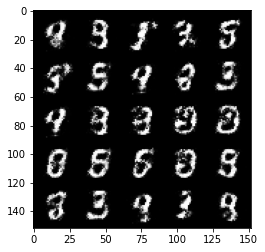

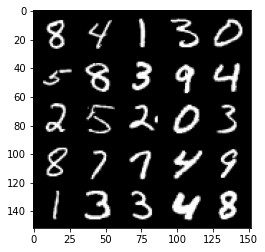

Step 25000: Generator loss: 3.024059763908386, discriminator loss: 0.1922309330254794


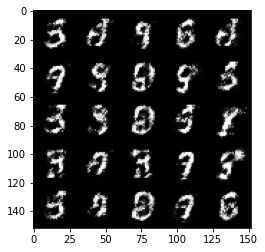

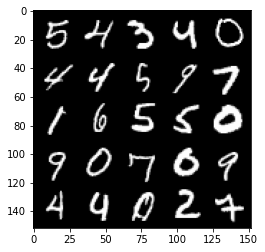

Step 25500: Generator loss: 3.0161917481422407, discriminator loss: 0.18125609606504434


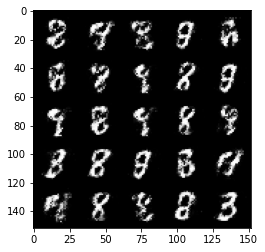

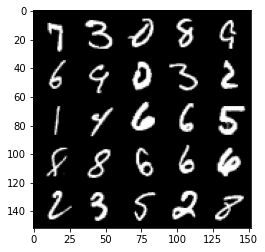

Step 26000: Generator loss: 3.0392907977104175, discriminator loss: 0.19253392104804493


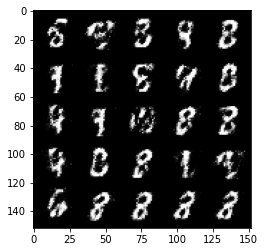

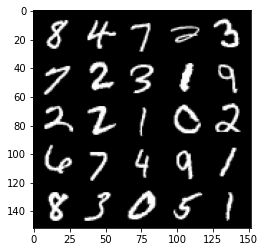

Step 26500: Generator loss: 2.9310788006782538, discriminator loss: 0.21624140173196774


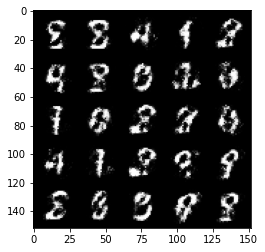

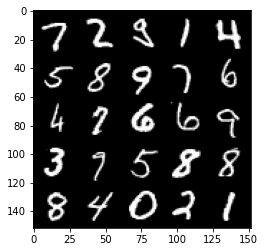

Step 27000: Generator loss: 2.9731932973861674, discriminator loss: 0.20943891881406299


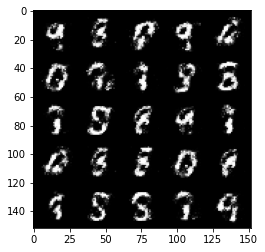

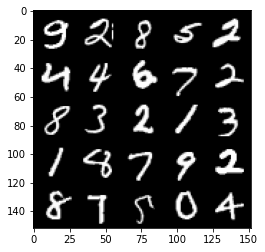

Step 27500: Generator loss: 3.083089416027072, discriminator loss: 0.19376161955296972


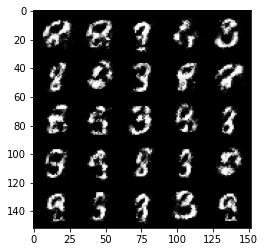

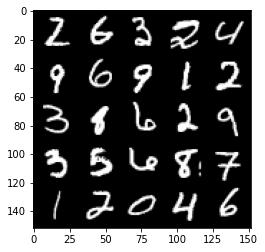

Step 28000: Generator loss: 2.910606976032261, discriminator loss: 0.1985603400617837


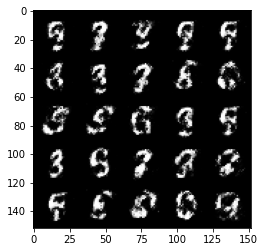

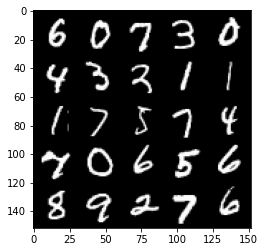

Step 28500: Generator loss: 2.811724878311156, discriminator loss: 0.21776060691475876


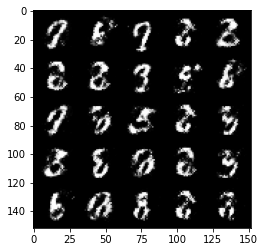

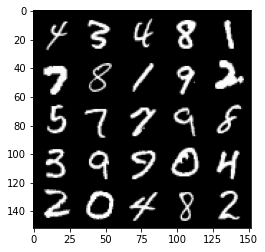

Step 29000: Generator loss: 2.9068196768760695, discriminator loss: 0.22040292252600174


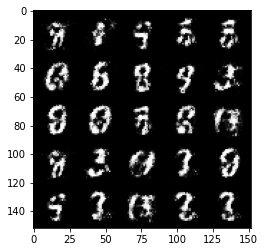

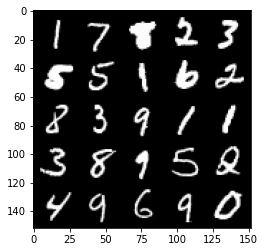

Step 29500: Generator loss: 2.8179229087829594, discriminator loss: 0.2092207220196725


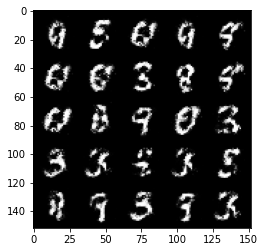

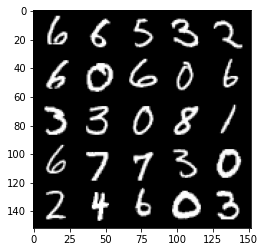

Step 30000: Generator loss: 2.846846121788025, discriminator loss: 0.21447841976583024


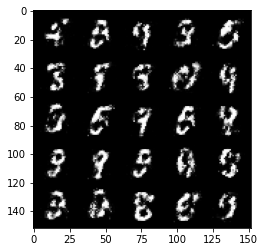

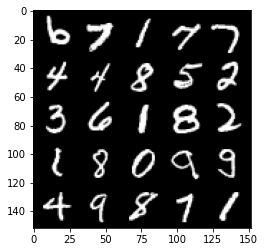

Step 30500: Generator loss: 2.868861272811889, discriminator loss: 0.21007025167346036


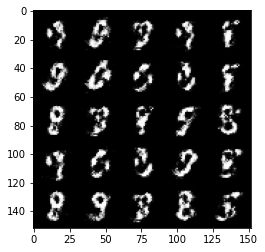

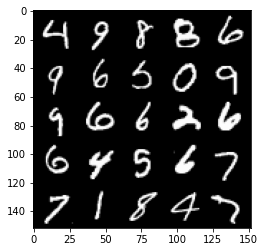

Step 31000: Generator loss: 2.798670610427857, discriminator loss: 0.228814888983965


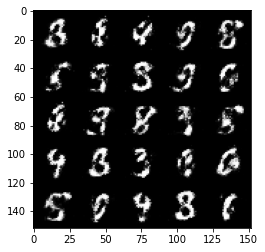

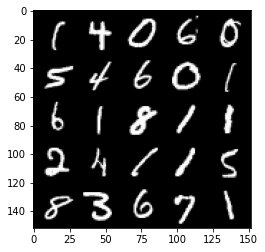

Step 31500: Generator loss: 2.7827964501380897, discriminator loss: 0.22104488807916642


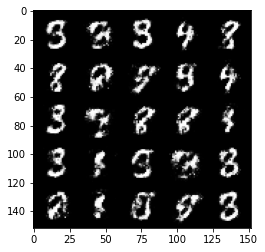

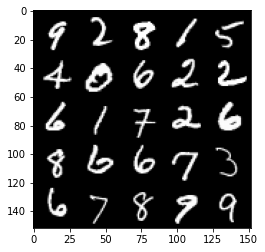

Step 32000: Generator loss: 2.655924528598786, discriminator loss: 0.23674847370386107


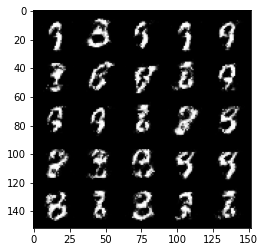

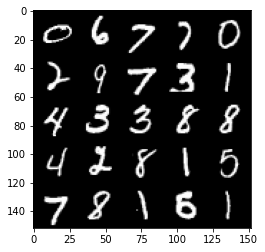

Step 32500: Generator loss: 2.6758727445602415, discriminator loss: 0.2286053230762482


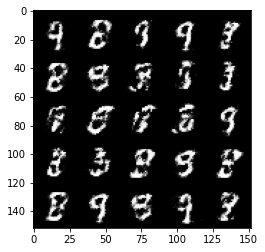

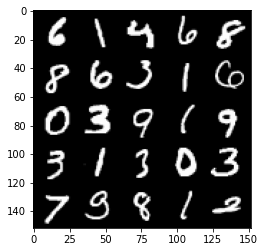

Step 33000: Generator loss: 2.871340625762942, discriminator loss: 0.19367294169962407


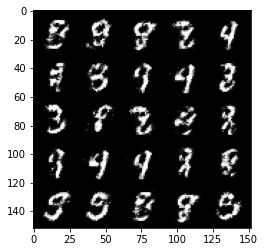

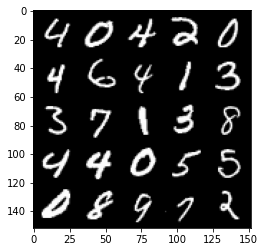

Step 33500: Generator loss: 2.6881477489471406, discriminator loss: 0.21688942420482635


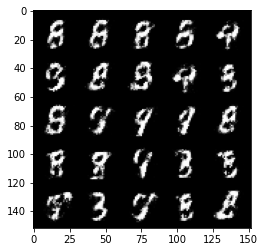

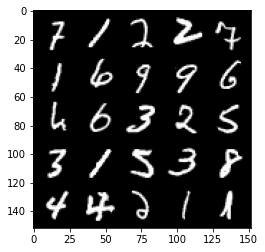

Step 34000: Generator loss: 2.6500505700111403, discriminator loss: 0.22301102653145788


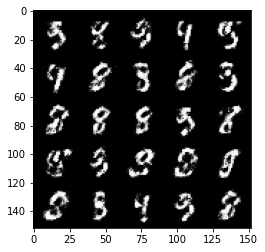

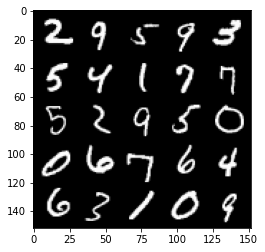

Step 34500: Generator loss: 2.4840972108840913, discriminator loss: 0.26484072273969655


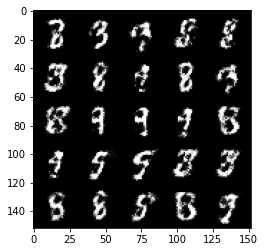

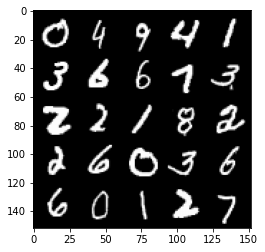

Step 35000: Generator loss: 2.5109442706108096, discriminator loss: 0.24688898402452486


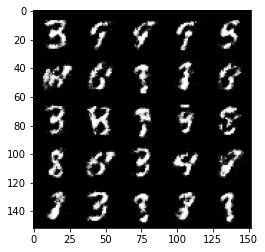

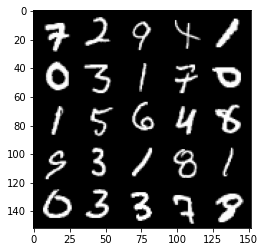

Step 35500: Generator loss: 2.605266391515733, discriminator loss: 0.2330513501167297


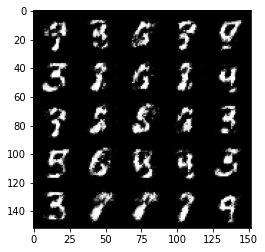

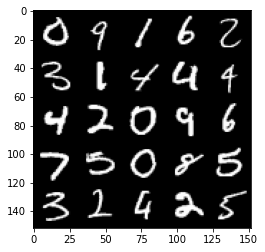

Step 36000: Generator loss: 2.515261050224305, discriminator loss: 0.2507373593449594


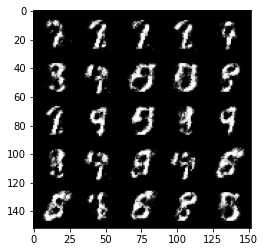

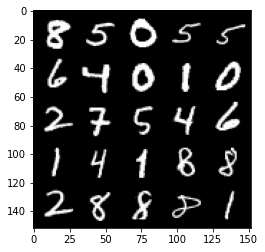

Step 36500: Generator loss: 2.4965215530395493, discriminator loss: 0.271656950175762


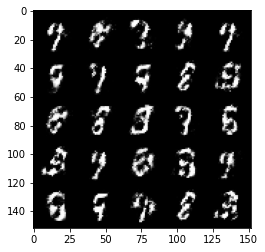

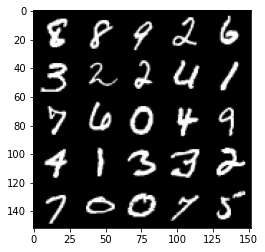

Step 37000: Generator loss: 2.460869524717331, discriminator loss: 0.26446939885616333


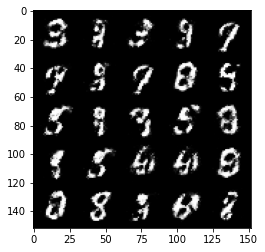

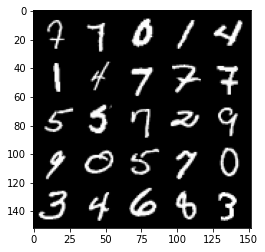

Step 37500: Generator loss: 2.4709489159584055, discriminator loss: 0.26299420312046984


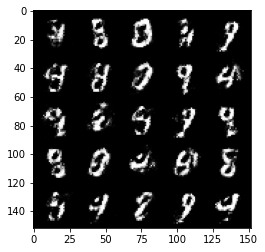

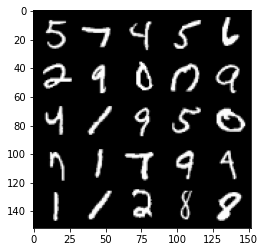

Step 38000: Generator loss: 2.458476078510286, discriminator loss: 0.2657726733386513


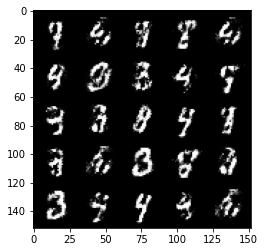

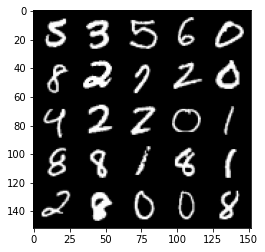

Step 38500: Generator loss: 2.3979132766723623, discriminator loss: 0.27331455278396616


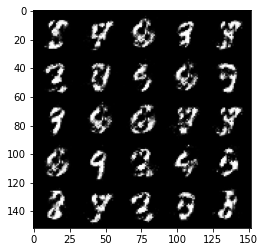

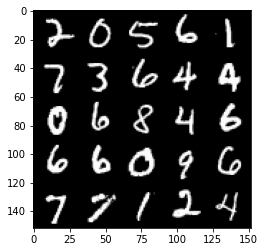

Step 39000: Generator loss: 2.4332003855705255, discriminator loss: 0.27304636028409


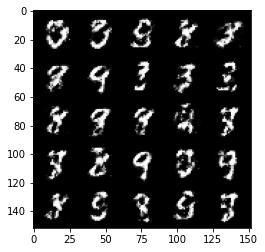

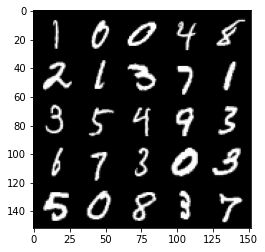

Step 39500: Generator loss: 2.436728341579436, discriminator loss: 0.2753083937466143


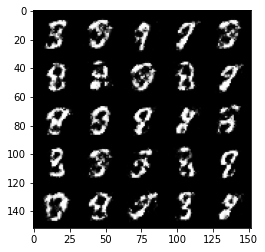

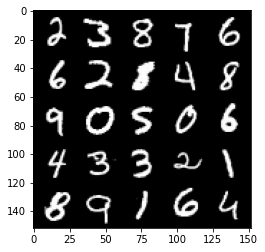

Step 40000: Generator loss: 2.341437782764434, discriminator loss: 0.2936050947308537


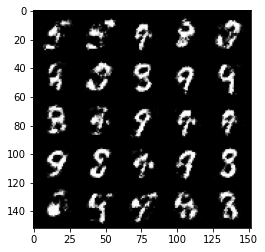

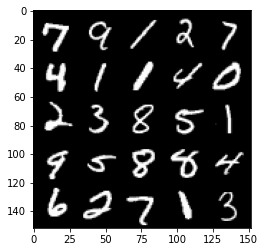

Step 40500: Generator loss: 2.3446542360782634, discriminator loss: 0.27018749701976785


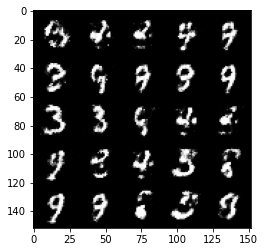

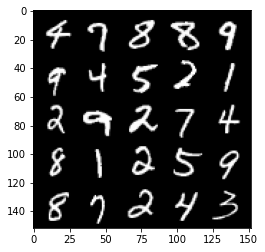

Step 41000: Generator loss: 2.2378455765247347, discriminator loss: 0.29949923530220973


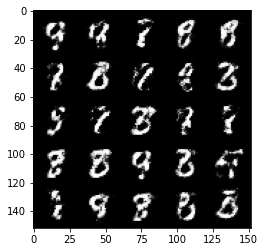

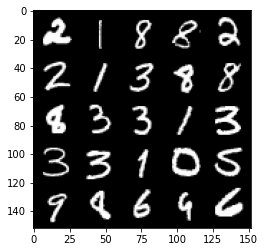

Step 41500: Generator loss: 2.209299211263655, discriminator loss: 0.3066052237749104


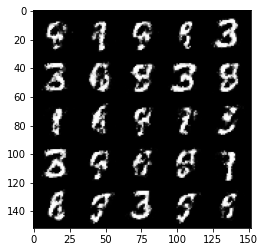

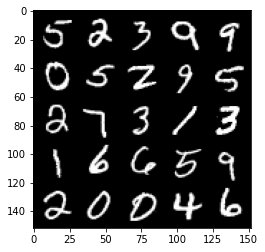

Step 42000: Generator loss: 2.1719359512329124, discriminator loss: 0.31445747759938264


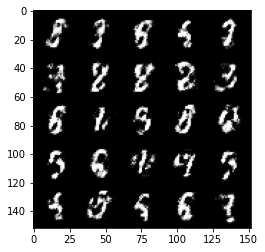

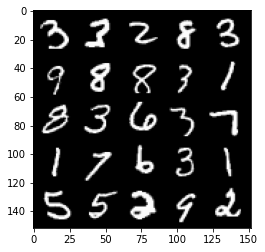

Step 42500: Generator loss: 2.286998154878616, discriminator loss: 0.2854720069766045


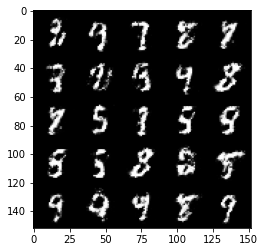

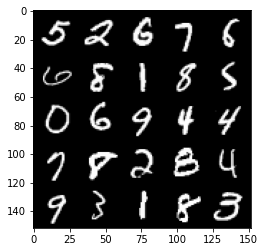

Step 43000: Generator loss: 2.0992287786006925, discriminator loss: 0.3248037140965463


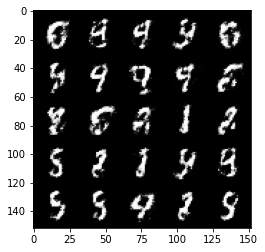

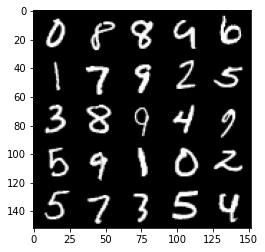

Step 43500: Generator loss: 2.2821070477962486, discriminator loss: 0.2787971581220632


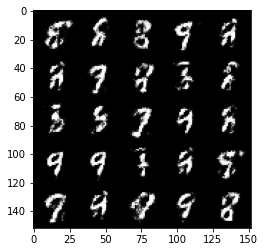

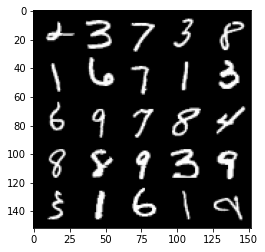

Step 44000: Generator loss: 2.2655252087116238, discriminator loss: 0.29840536463260625


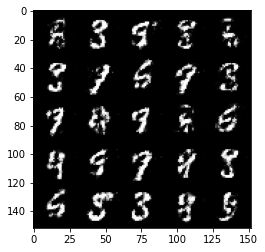

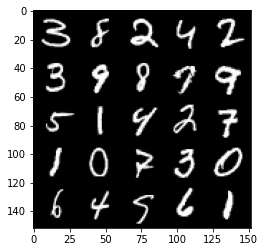

Step 44500: Generator loss: 2.3224779100418083, discriminator loss: 0.2861173503696917


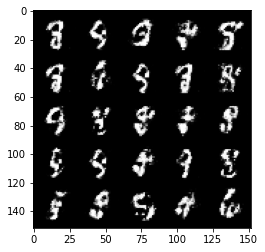

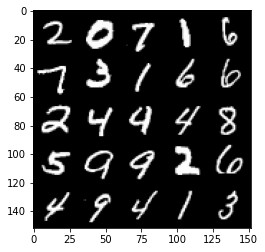

Step 45000: Generator loss: 2.391531482219696, discriminator loss: 0.27169499912858003


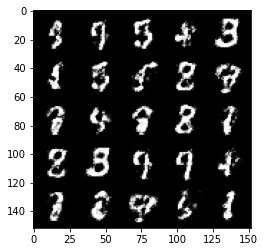

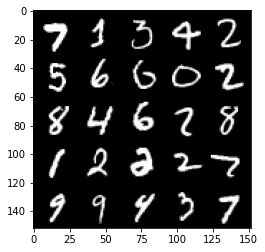

Step 45500: Generator loss: 2.2139345066547373, discriminator loss: 0.3030526082217692


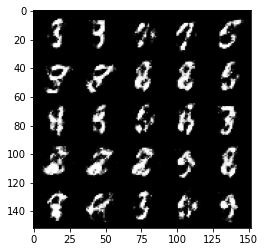

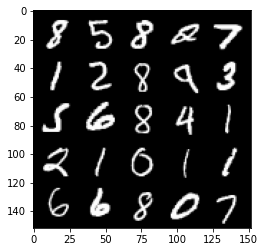

Step 46000: Generator loss: 2.270416453838348, discriminator loss: 0.30131249859929077


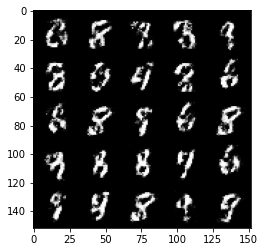

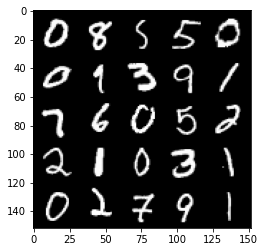

Step 46500: Generator loss: 2.227786026477813, discriminator loss: 0.29046581715345376


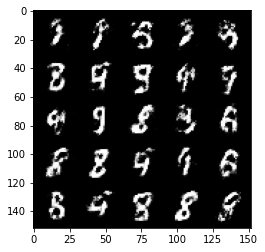

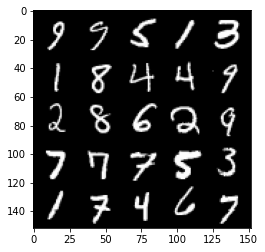

Step 47000: Generator loss: 2.147261228561402, discriminator loss: 0.31650277858972525


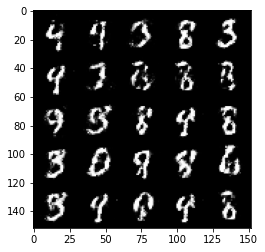

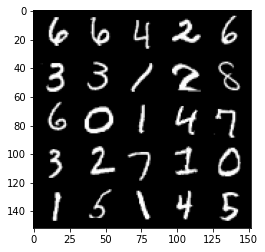

Step 47500: Generator loss: 2.0584211652278905, discriminator loss: 0.31424604567885434


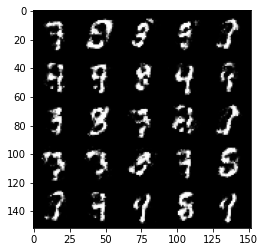

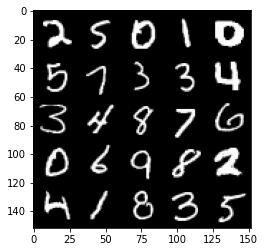

Step 48000: Generator loss: 2.0641860156059257, discriminator loss: 0.3138479424118993


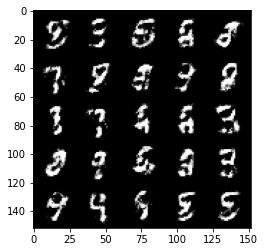

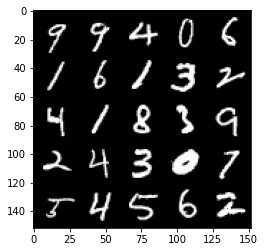

Step 48500: Generator loss: 2.16627209019661, discriminator loss: 0.2899556442797184


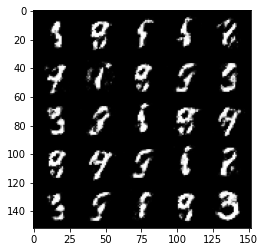

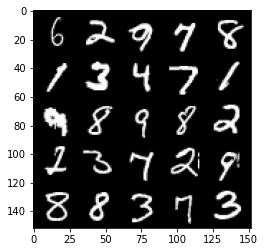

Step 49000: Generator loss: 2.0377336139678963, discriminator loss: 0.3407200410664084


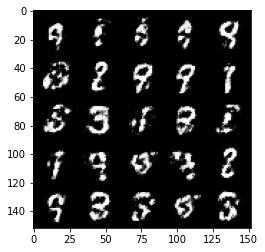

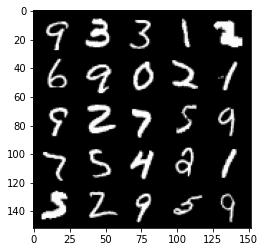

Step 49500: Generator loss: 2.006135950803757, discriminator loss: 0.32688390082120905


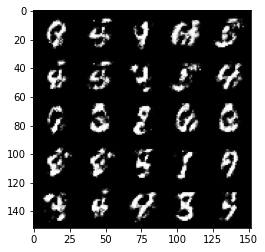

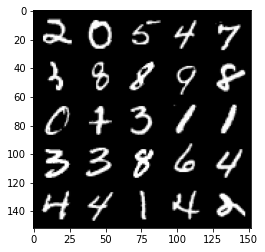

Step 50000: Generator loss: 2.114147795438766, discriminator loss: 0.2991359621584417


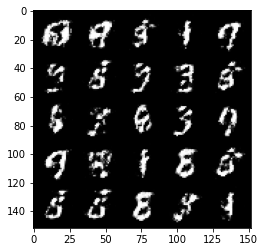

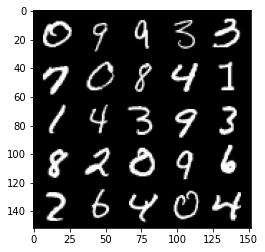

Step 50500: Generator loss: 2.182759216308594, discriminator loss: 0.3032675790190694


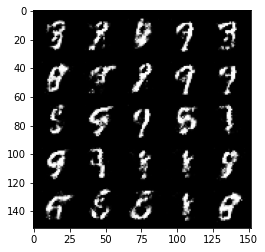

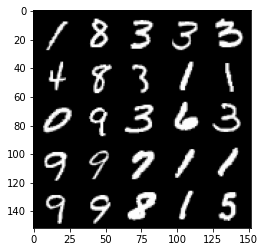

Step 51000: Generator loss: 1.8847960908412937, discriminator loss: 0.3614991208910945


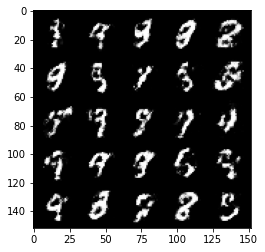

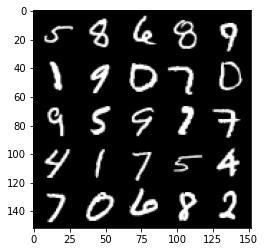

Step 51500: Generator loss: 2.0097719593048105, discriminator loss: 0.31527785840630546


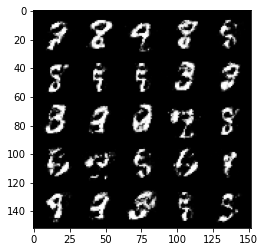

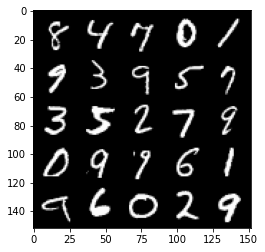

Step 52000: Generator loss: 1.9839193122386936, discriminator loss: 0.35563617289066324


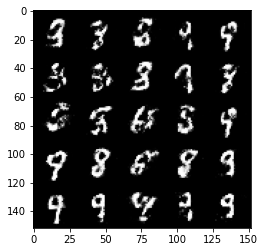

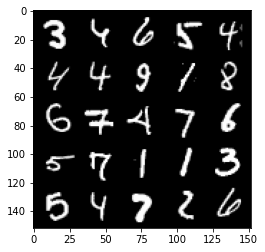

Step 52500: Generator loss: 1.865129088640212, discriminator loss: 0.3597124663591385


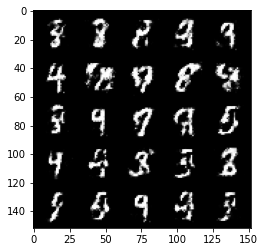

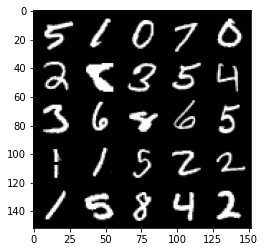

Step 53000: Generator loss: 1.9725955049991608, discriminator loss: 0.32983037400245674


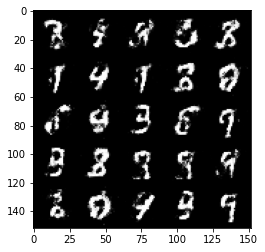

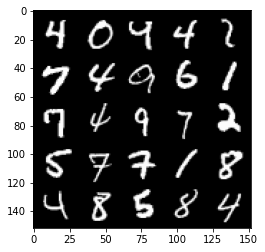

Step 53500: Generator loss: 1.993539783477783, discriminator loss: 0.3196969541311264


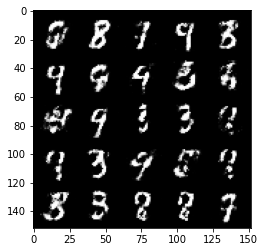

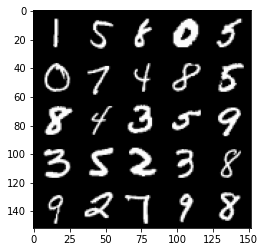

Step 54000: Generator loss: 2.0226132345199574, discriminator loss: 0.31547554525733


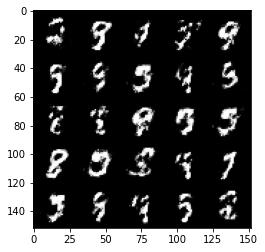

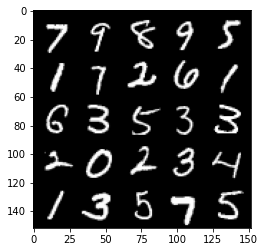

Step 54500: Generator loss: 1.9229771075248705, discriminator loss: 0.3579986751377583


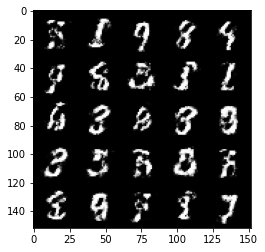

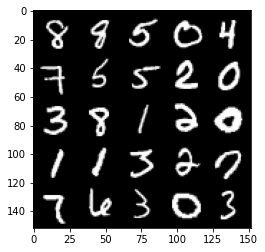

Step 55000: Generator loss: 1.8126100893020636, discriminator loss: 0.36683795982599254


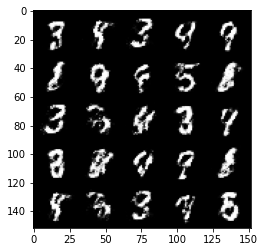

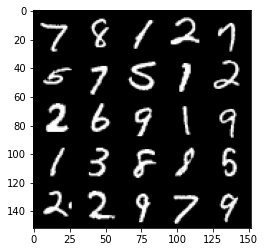

Step 55500: Generator loss: 1.8167438409328462, discriminator loss: 0.3618006419539453


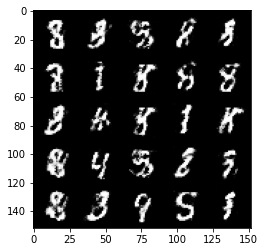

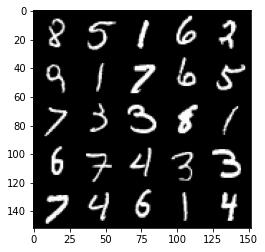

Step 56000: Generator loss: 1.7808794984817515, discriminator loss: 0.38289194667339316


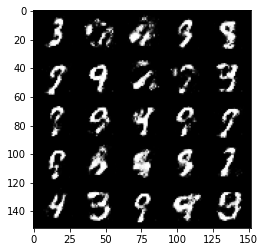

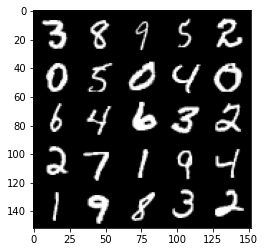

Step 56500: Generator loss: 1.7699014208316823, discriminator loss: 0.37648533725738526


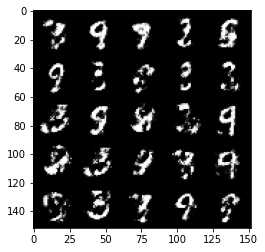

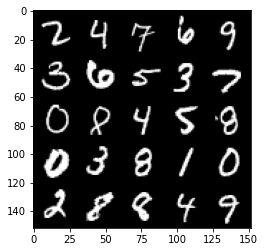

Step 57000: Generator loss: 1.851845074653623, discriminator loss: 0.3576095969080928


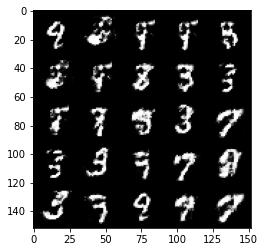

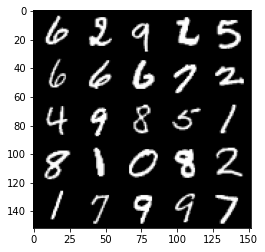

Step 57500: Generator loss: 1.7822425866127007, discriminator loss: 0.37724562871456174


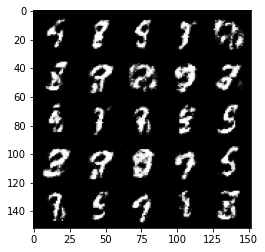

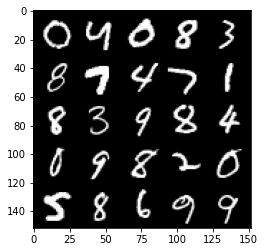

Step 58000: Generator loss: 1.8114654438495634, discriminator loss: 0.36769207635521883


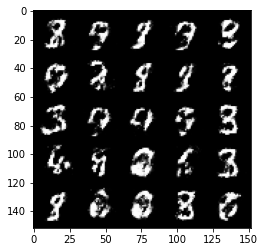

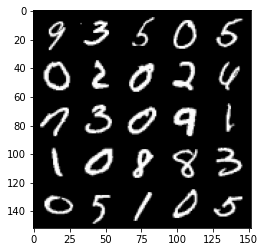

Step 58500: Generator loss: 1.891876108407974, discriminator loss: 0.3482789739668368


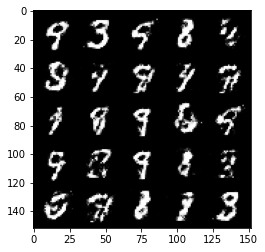

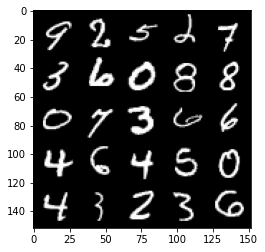

Step 59000: Generator loss: 1.7559247002601621, discriminator loss: 0.39605339139699935


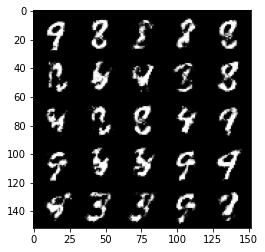

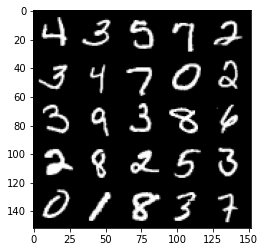

Step 59500: Generator loss: 1.8588976049423223, discriminator loss: 0.3596797989308834


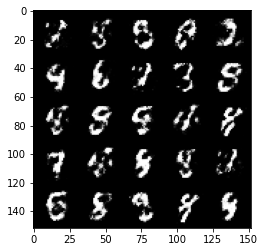

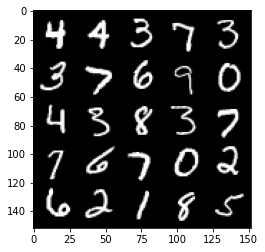

Step 60000: Generator loss: 1.8033719398975365, discriminator loss: 0.36956591236591346


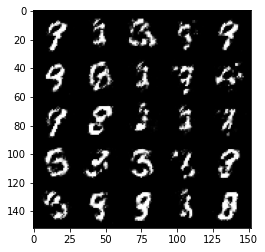

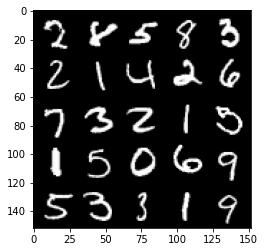

Step 60500: Generator loss: 1.9072620854377749, discriminator loss: 0.33390506571531287


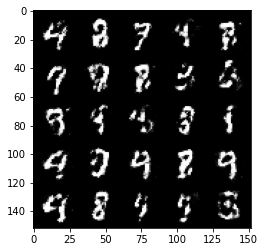

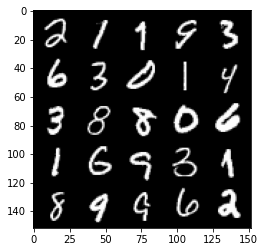

Step 61000: Generator loss: 1.9122571871280685, discriminator loss: 0.3529030884504323


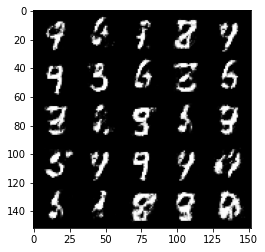

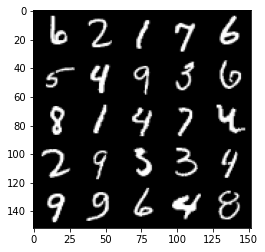

Step 61500: Generator loss: 1.723235872983933, discriminator loss: 0.38342641234397923


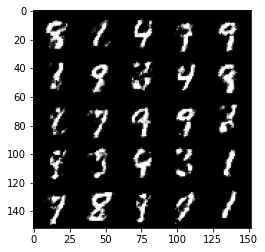

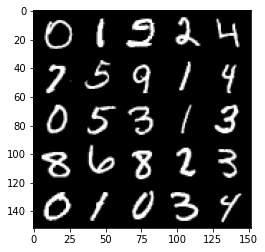

Step 62000: Generator loss: 1.8198515608310686, discriminator loss: 0.3483279741406442


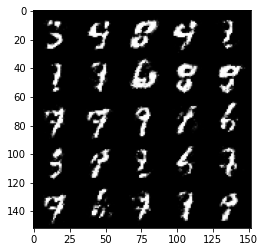

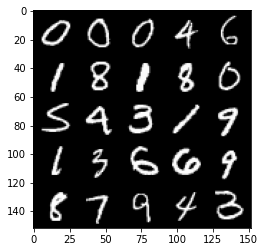

Step 62500: Generator loss: 1.8605709261894228, discriminator loss: 0.3462633208036422


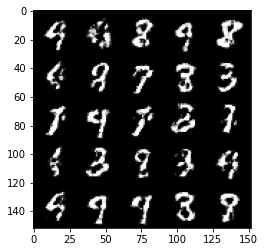

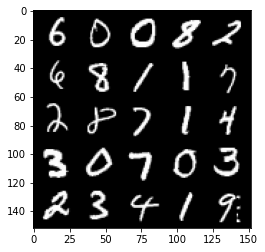

Step 63000: Generator loss: 1.815212851047517, discriminator loss: 0.37527147424221025


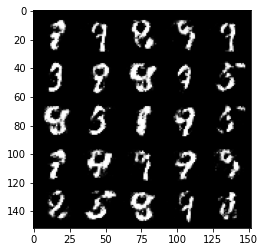

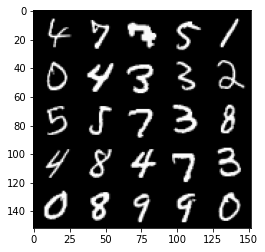

Step 63500: Generator loss: 1.8051176502704622, discriminator loss: 0.3662969292104248


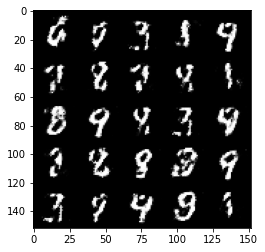

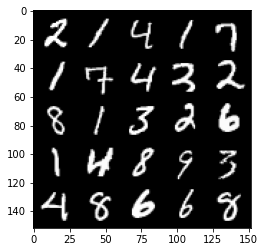

Step 64000: Generator loss: 1.8000129799842821, discriminator loss: 0.3617044202089305


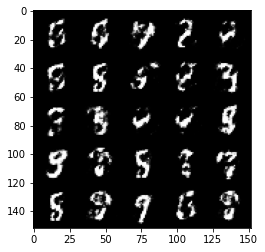

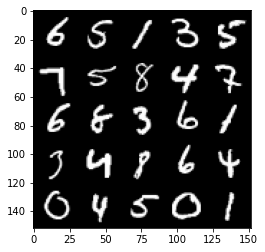

Step 64500: Generator loss: 1.8631584897041298, discriminator loss: 0.3429820783734321


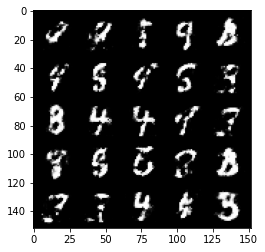

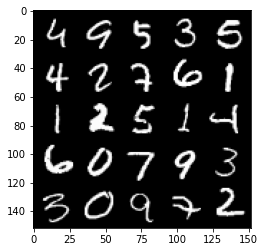

Step 65000: Generator loss: 1.7680771219730373, discriminator loss: 0.3873428165912628


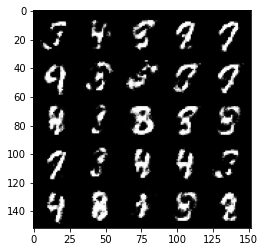

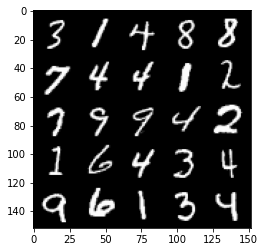

Step 65500: Generator loss: 1.7465137488842006, discriminator loss: 0.3628351683616635


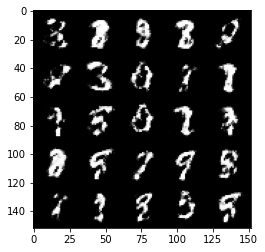

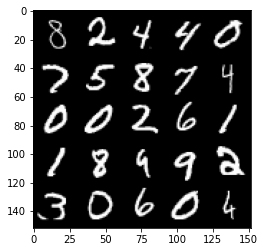

Step 66000: Generator loss: 1.6642037153244027, discriminator loss: 0.39061281180381774


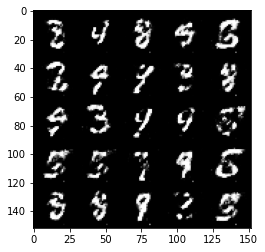

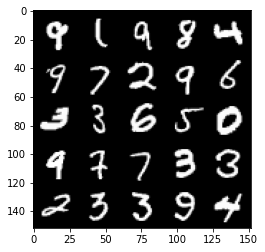

Step 66500: Generator loss: 1.7502304005622875, discriminator loss: 0.37165235024690635


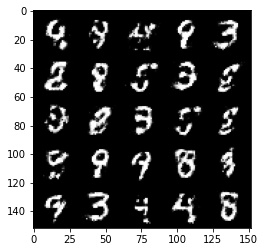

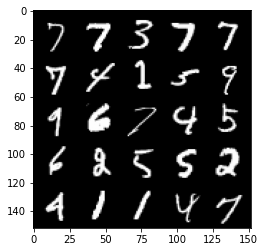

Step 67000: Generator loss: 1.6314770276546475, discriminator loss: 0.41664372664690025


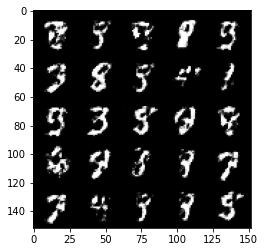

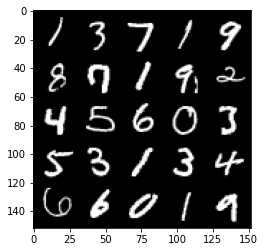

Step 67500: Generator loss: 1.7320092325210583, discriminator loss: 0.37779071104526546


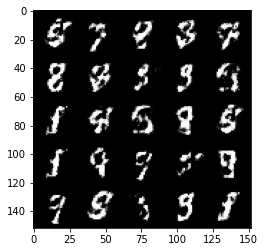

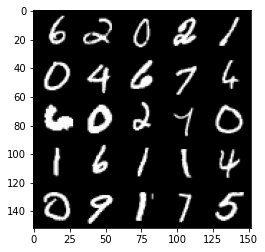

Step 68000: Generator loss: 1.5771202793121346, discriminator loss: 0.41581816190481186


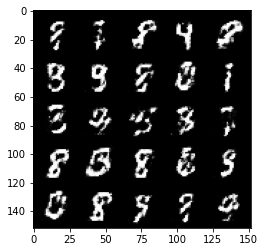

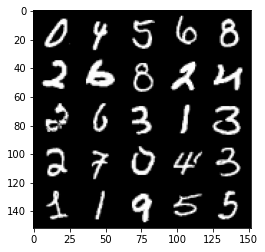

Step 68500: Generator loss: 1.6781003210544612, discriminator loss: 0.39557560718059537


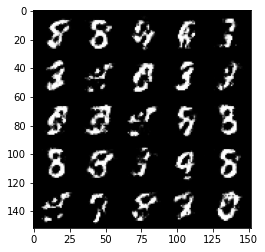

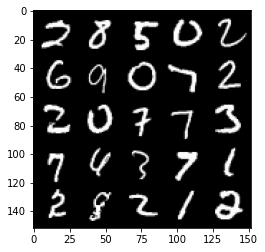

Step 69000: Generator loss: 1.660384408235551, discriminator loss: 0.37928772503137625


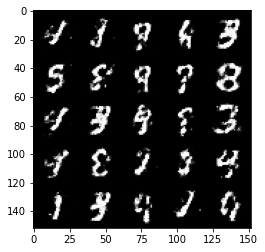

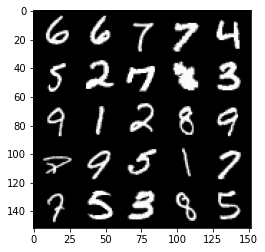

Step 69500: Generator loss: 1.670322684526444, discriminator loss: 0.3815608580708502


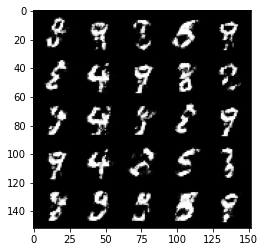

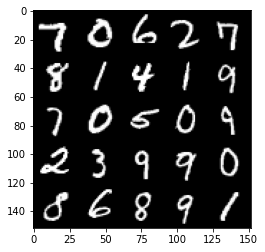

Step 70000: Generator loss: 1.6214065728187559, discriminator loss: 0.39686462098360037


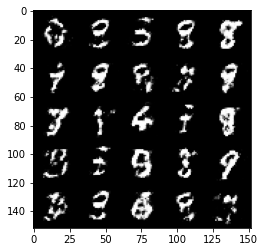

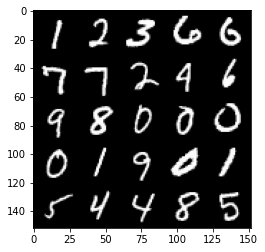

Step 70500: Generator loss: 1.6189005115032185, discriminator loss: 0.39165811800956757


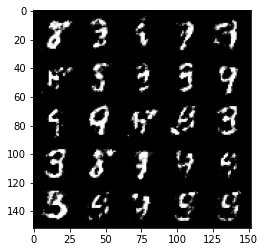

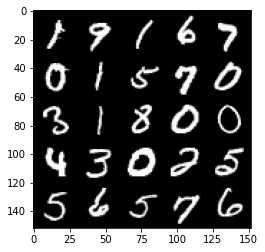

Step 71000: Generator loss: 1.6828264448642745, discriminator loss: 0.3807202170491218


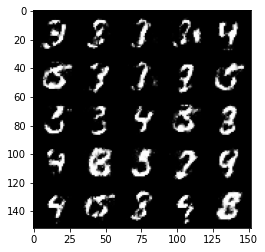

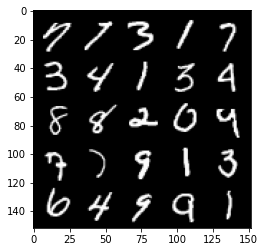

Step 71500: Generator loss: 1.6634408979415907, discriminator loss: 0.3760405309200286


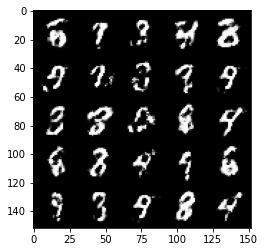

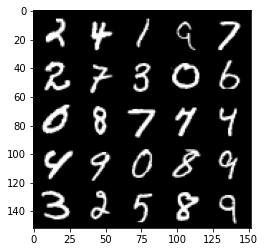

Step 72000: Generator loss: 1.6096558153629301, discriminator loss: 0.4098966343998908


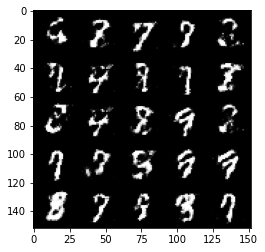

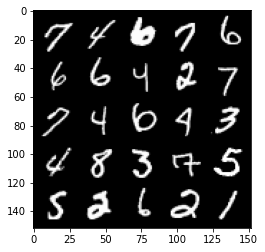

Step 72500: Generator loss: 1.640138277292253, discriminator loss: 0.3933544934391969


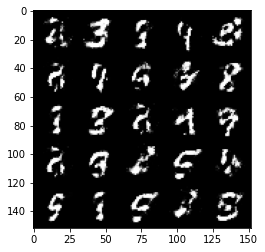

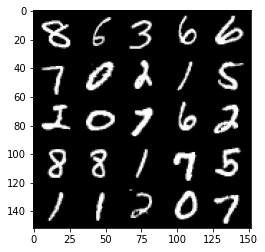

Step 73000: Generator loss: 1.7067474603652957, discriminator loss: 0.36817818725109064


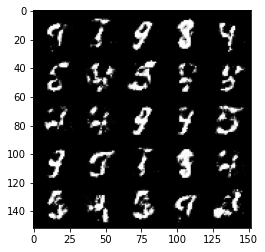

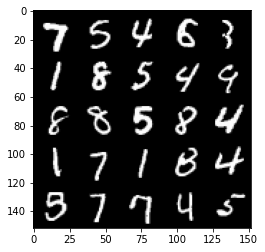

Step 73500: Generator loss: 1.683797039031983, discriminator loss: 0.3820954168438912


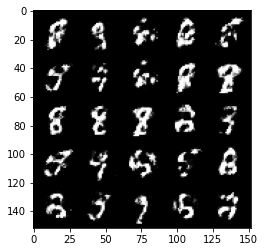

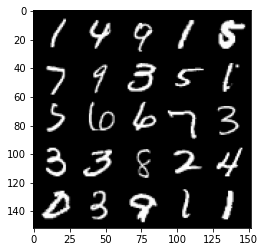

Step 74000: Generator loss: 1.7379013357162472, discriminator loss: 0.3711319940090182


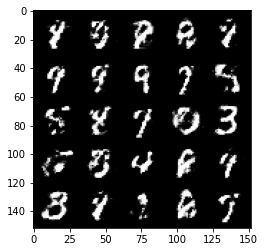

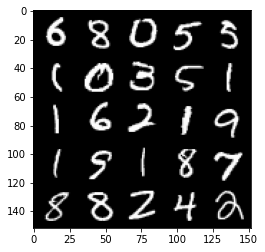

Step 74500: Generator loss: 1.5627646498680094, discriminator loss: 0.4293478700518607


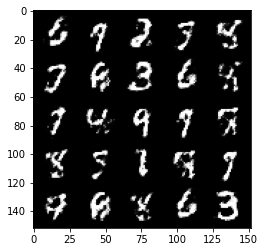

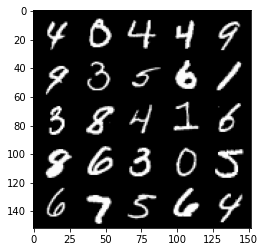

Step 75000: Generator loss: 1.6093778398036958, discriminator loss: 0.39606811612844445


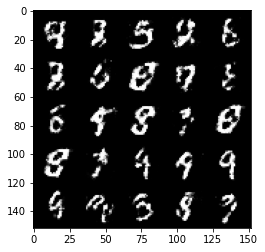

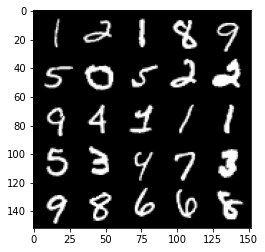

Step 75500: Generator loss: 1.543025562047959, discriminator loss: 0.42139987593889233


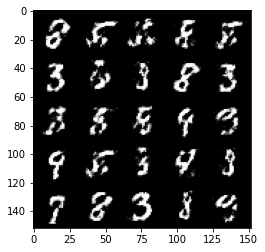

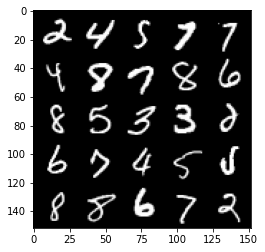

Step 76000: Generator loss: 1.596077466249465, discriminator loss: 0.4088707844018938


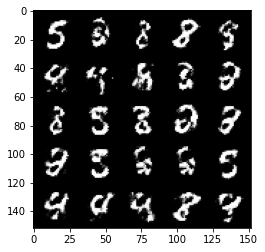

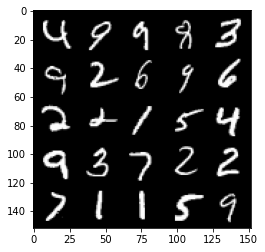

Step 76500: Generator loss: 1.5636935150623308, discriminator loss: 0.4135806278586382


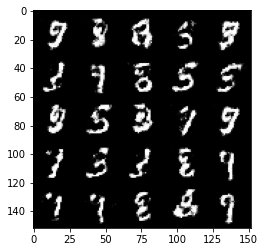

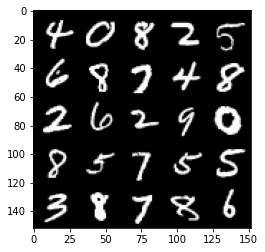

Step 77000: Generator loss: 1.5331813328266142, discriminator loss: 0.4194946322441099


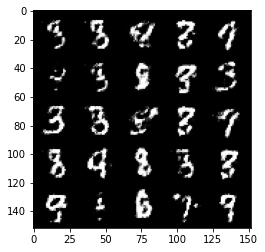

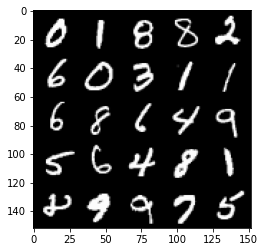

Step 77500: Generator loss: 1.4564722480773926, discriminator loss: 0.4465186938643456


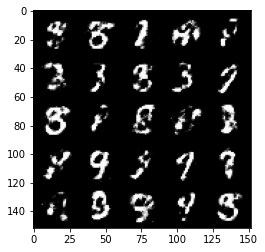

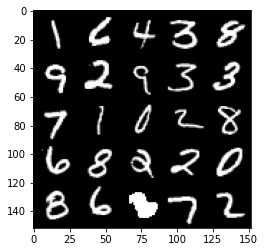

Step 78000: Generator loss: 1.4479677412509933, discriminator loss: 0.44097236591577527


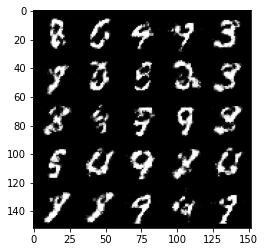

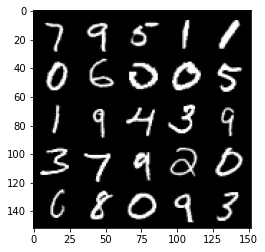

Step 78500: Generator loss: 1.504533938169479, discriminator loss: 0.4270476785302161


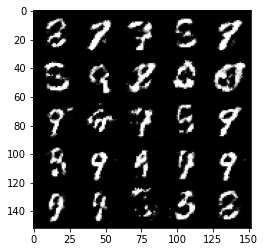

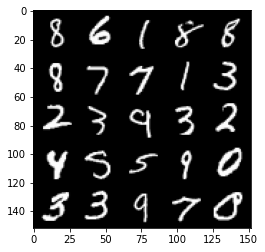

Step 79000: Generator loss: 1.5739964752197262, discriminator loss: 0.40604540729522687


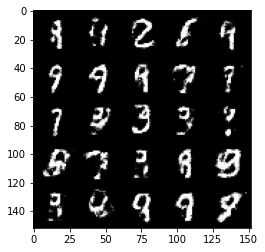

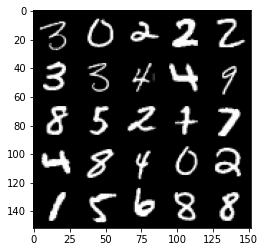

Step 79500: Generator loss: 1.57333068203926, discriminator loss: 0.41247443515062315


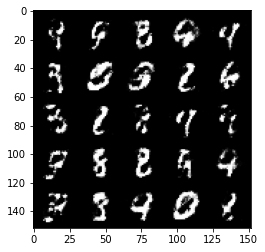

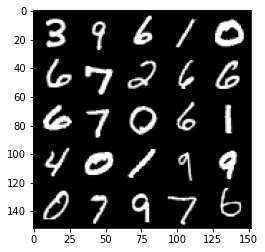

Step 80000: Generator loss: 1.5755579452514643, discriminator loss: 0.4102998011112214


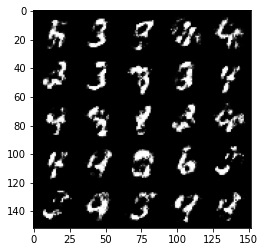

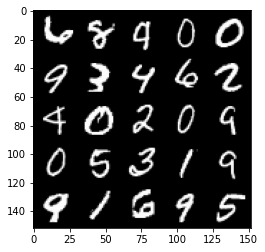

Step 80500: Generator loss: 1.6115907657146464, discriminator loss: 0.4078679227828983


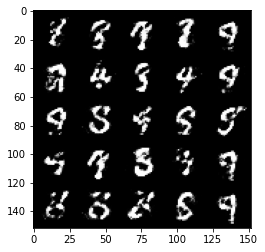

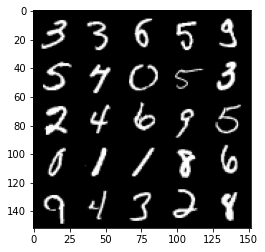

Step 81000: Generator loss: 1.5310625231266022, discriminator loss: 0.43154007625579827


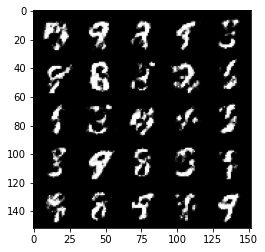

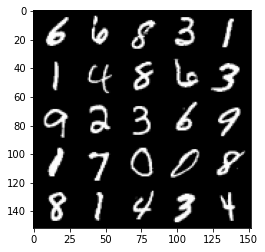

Step 81500: Generator loss: 1.5540764615535732, discriminator loss: 0.41224327427148816


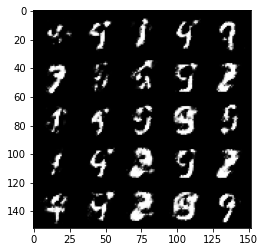

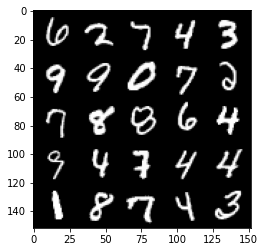

Step 82000: Generator loss: 1.5248899295330034, discriminator loss: 0.4166018164157865


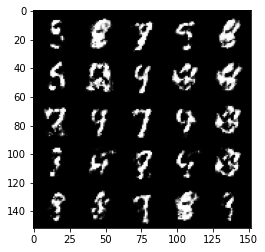

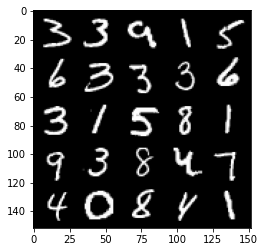

Step 82500: Generator loss: 1.5987207117080688, discriminator loss: 0.3965352495908733


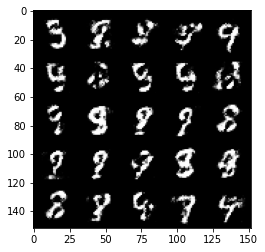

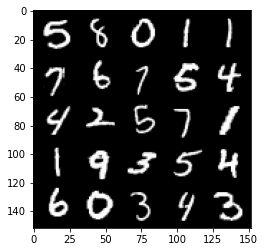

Step 83000: Generator loss: 1.5338640830516819, discriminator loss: 0.41841313517093603


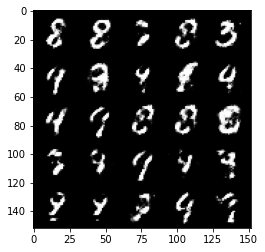

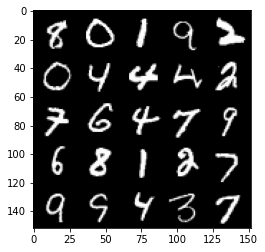

Step 83500: Generator loss: 1.5538315184116362, discriminator loss: 0.41177437871694533


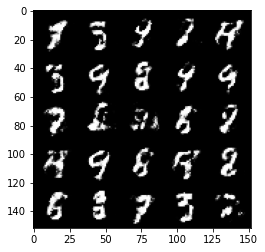

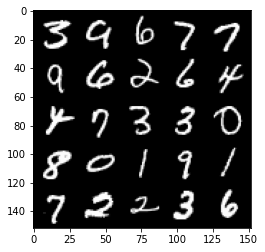

Step 84000: Generator loss: 1.5607898027896885, discriminator loss: 0.4112376289963725


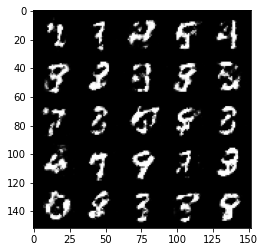

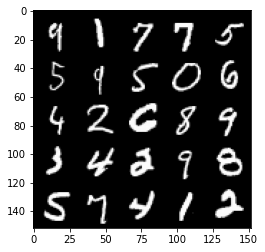

Step 84500: Generator loss: 1.5354788467884062, discriminator loss: 0.41375552797317483


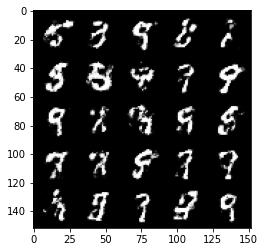

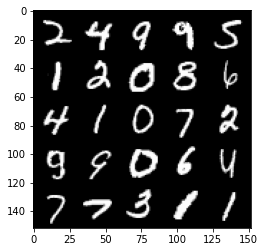

Step 85000: Generator loss: 1.466245941877366, discriminator loss: 0.4305524861216543


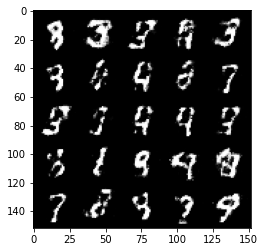

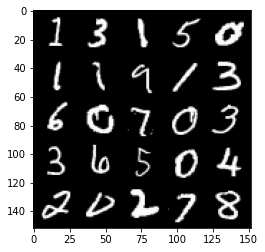

Step 85500: Generator loss: 1.5715617449283599, discriminator loss: 0.3854380620717997


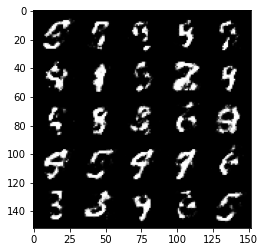

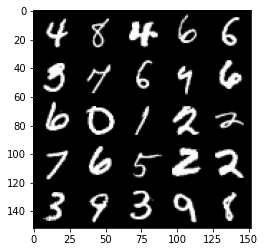

Step 86000: Generator loss: 1.541555971145631, discriminator loss: 0.4064929359555246


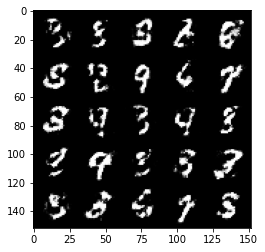

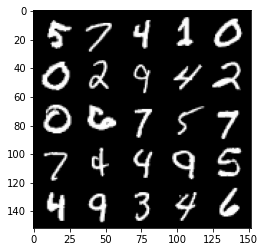

Step 86500: Generator loss: 1.5817868041992191, discriminator loss: 0.38469145655632064


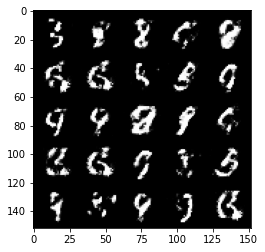

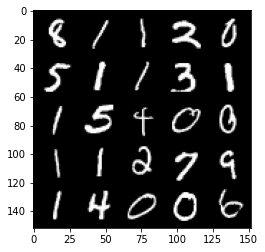

Step 87000: Generator loss: 1.551227938413621, discriminator loss: 0.4080713436603549


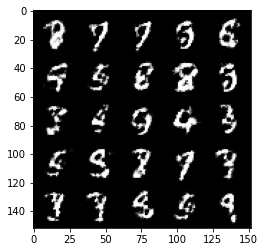

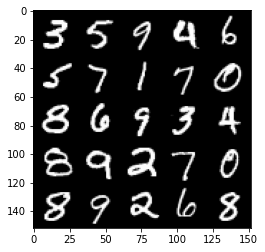

Step 87500: Generator loss: 1.5240819401741026, discriminator loss: 0.4174613106250764


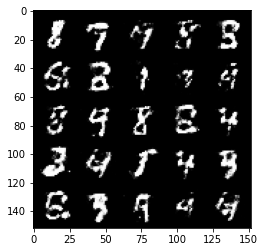

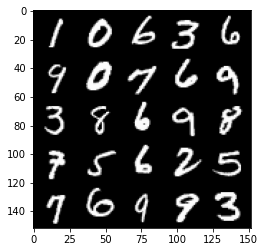

Step 88000: Generator loss: 1.4443673660755156, discriminator loss: 0.4458459337949752


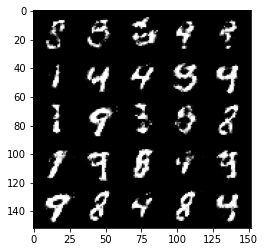

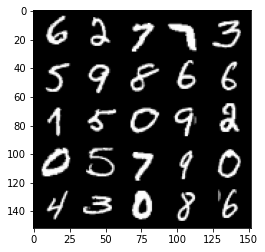

Step 88500: Generator loss: 1.455393840074539, discriminator loss: 0.42926018673181515


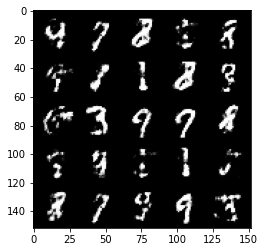

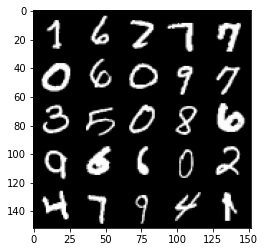

Step 89000: Generator loss: 1.3891231498718248, discriminator loss: 0.4549980435967443


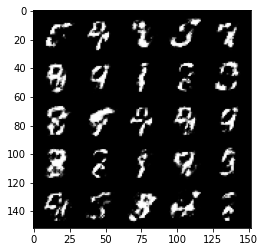

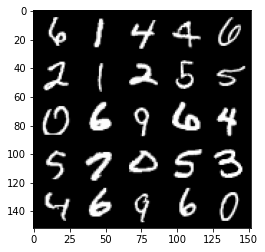

Step 89500: Generator loss: 1.4401534564495082, discriminator loss: 0.4260969932675366


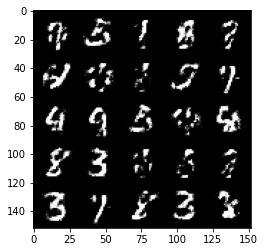

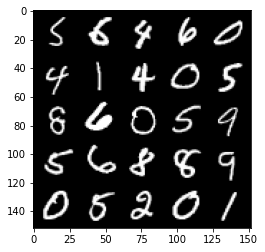

Step 90000: Generator loss: 1.405445761203766, discriminator loss: 0.44561135262250884


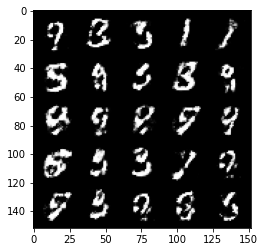

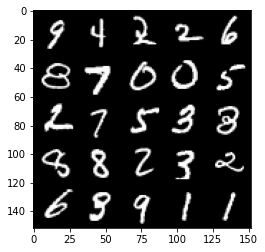

Step 90500: Generator loss: 1.3853316557407378, discriminator loss: 0.46621642273664476


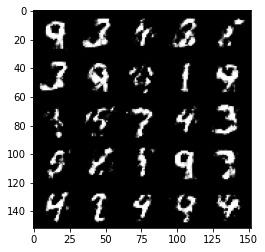

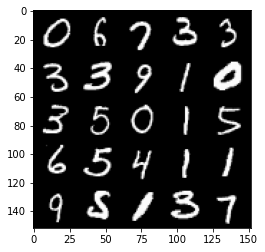

Step 91000: Generator loss: 1.2534240393638612, discriminator loss: 0.5035088990926739


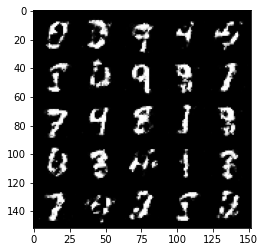

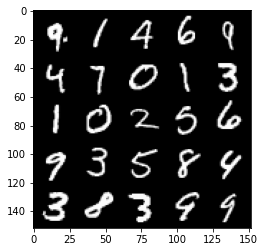

Step 91500: Generator loss: 1.4183249380588543, discriminator loss: 0.4451131516098978


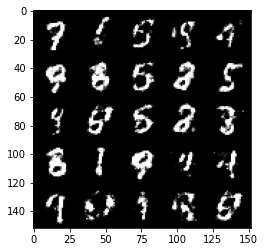

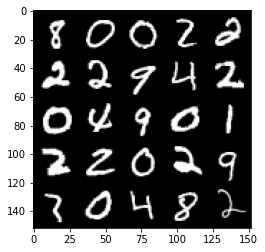

Step 92000: Generator loss: 1.3569506163597103, discriminator loss: 0.4621190970540046


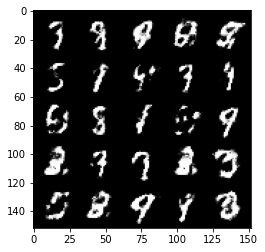

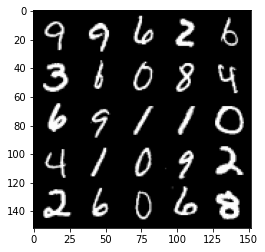

Step 92500: Generator loss: 1.3915499708652501, discriminator loss: 0.4445293269753453


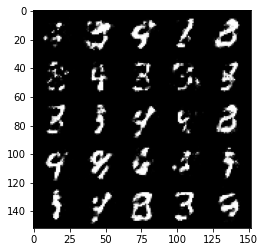

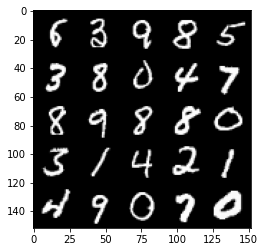

Step 93000: Generator loss: 1.354167795181273, discriminator loss: 0.475121162891388


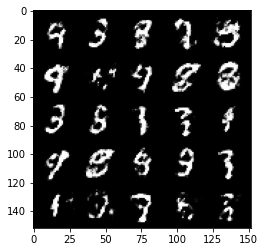

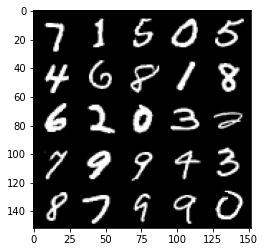

Step 93500: Generator loss: 1.3238063755035399, discriminator loss: 0.46925292277336106


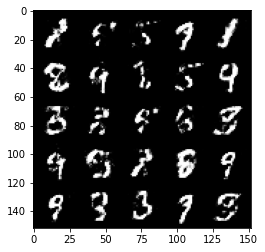

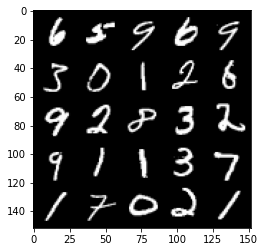

In [15]:

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        #Zero out the gradients
        gen_opt.zero_grad()
        # Calculate the generator loss, assigning it to gen_loss
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        # Backprop through the generator: update the gradients and optimizer
        gen_loss.backward()
        gen_opt.step()
       

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1